# Exercise Sheet 11(Bonus) - MLP
Yiping Deng, Shalom-David Anifowoshe

We start by loading the data into python

In [1]:
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from numpy import linalg as la

In [2]:
data = pd.read_csv("data/mfeat-pix.txt",sep='\s+', header=None)

In [3]:
darr = data.values.astype(float)

In [4]:
def img_cat(darr):
    """
    reshape the image and show the image
    """
    img_mat = darr.reshape(16, 15) # reshape the d array
    plt.imshow(img_mat, cmap='gray')
    plt.show()
def imgs_cat(darr):
    for rows in darr:
        img_cat(rows)



## Training and test data

The training and test data are in (x,y) tuples, where x are the images and y are the digits they represent.

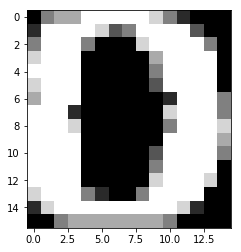

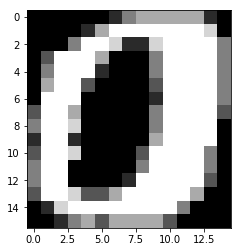

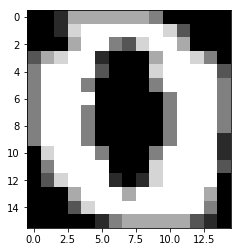

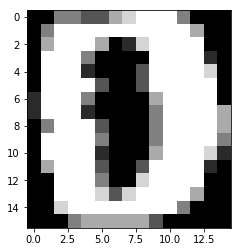

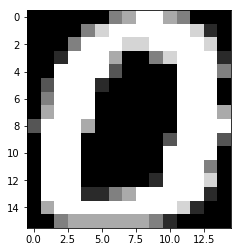

...

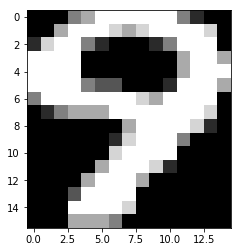

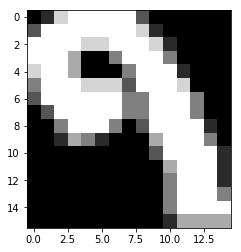

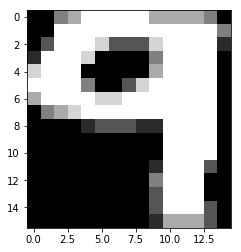

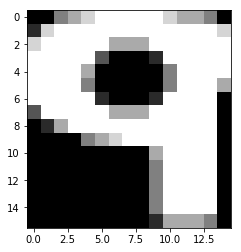

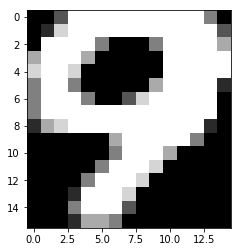

In [5]:
#take first 150 images for each digit for training
x_train = darr[np.r_[0:149, 200:349, 400:549, 600:749, 800:949, 1000:1149, 1200:1349, 1400:1549, 1600:1749, 1800:1949]]
y_train = []
for i in range (0, 10):
    for j in range (0, 150):
        y_train.append(i)
training_data = [(imgs_cat(x_train), y_train)]

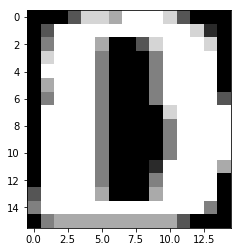

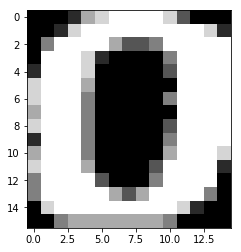

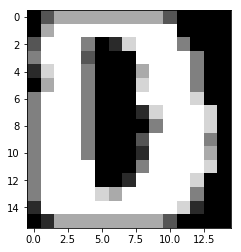

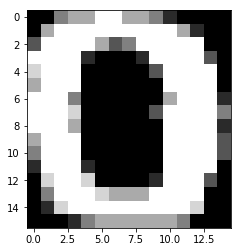

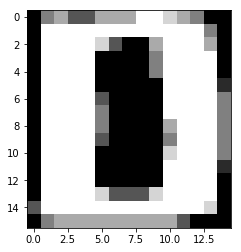

...

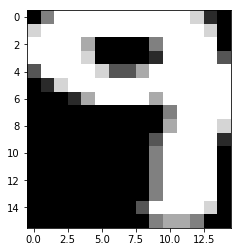

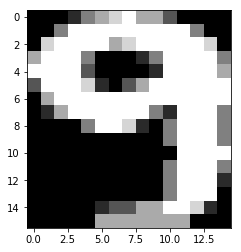

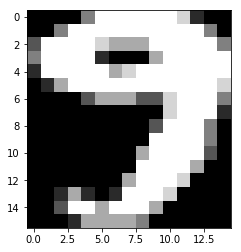

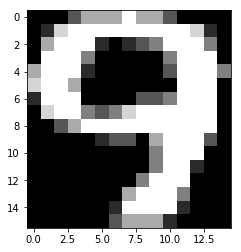

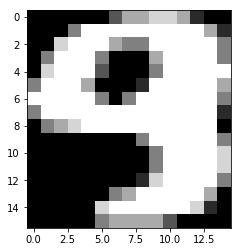

In [6]:
#take the remaining 50 images for each digit for testing
x_test = darr[np.r_[150:199, 350:399, 550:599, 750:799, 950:999, 1150:1199, 1350:1399, 1550:1599, 1750:1799, 1950:1999]]
y_test = []
for i in range (0, 10):
    for j in range (0, 50):
        y_test.append(i)
test_data = [(imgs_cat(x_test), y_test)]

In [7]:
# Code for visualizing MLP structure

def draw_neural_net(ax, left, right, bottom, top, layer_sizes):
    '''
    Draw a neural network cartoon using matplotilb.
    
    :usage:
        >>> fig = plt.figure(figsize=(12, 12))
        >>> draw_neural_net(fig.gca(), .1, .9, .1, .9, [4, 7, 2])
    
    :parameters:
        - ax : matplotlib.axes.AxesSubplot
            The axes on which to plot the cartoon (get e.g. by plt.gca())
        - left : float
            The center of the leftmost node(s) will be placed here
        - right : float
            The center of the rightmost node(s) will be placed here
        - bottom : float
            The center of the bottommost node(s) will be placed here
        - top : float
            The center of the topmost node(s) will be placed here
        - layer_sizes : list of int
            List of layer sizes, including input and output dimensionality
    '''
    n_layers = len(layer_sizes)
    v_spacing = (top - bottom)/float(max(layer_sizes))
    h_spacing = (right - left)/float(len(layer_sizes) - 1)
    # Nodes
    for n, layer_size in enumerate(layer_sizes):
        layer_top = v_spacing*(layer_size - 1)/2. + (top + bottom)/2.
        for m in range(layer_size):
            circle = plt.Circle((n*h_spacing + left, layer_top - m*v_spacing), v_spacing/4.,
                                color='w', ec='k', zorder=4)
            ax.add_artist(circle)
    # Edges
    for n, (layer_size_a, layer_size_b) in enumerate(zip(layer_sizes[:-1], layer_sizes[1:])):
        layer_top_a = v_spacing*(layer_size_a - 1)/2. + (top + bottom)/2.
        layer_top_b = v_spacing*(layer_size_b - 1)/2. + (top + bottom)/2.
        for m in range(layer_size_a):
            for o in range(layer_size_b):
                line = plt.Line2D([n*h_spacing + left, (n + 1)*h_spacing + left],
                                  [layer_top_a - m*v_spacing, layer_top_b - o*v_spacing], c='k')
                ax.add_artist(line)

## Structure of the Multiple Layer Perceptron
We use the classic structure of Multiple Layer Perceptron, with

1. The input layer consists of neuron encoded values of the input pixels. As our training data consists of numerous 15 by 16 pixel images, the input layer then consists of contains 240 layers. Each neuron in the input layer has a value ranging 0 (representing white) to 1 (representing black).
 
```Note: I used 10 layers input layers in the diagram so everything can be clearly visualized```
 
2. The hidden layer is the second layer. We will call the number of neurons in this layer n, as we will like to experiment with values of n.

```Note: I used 4 layers in the diagram for demonstration purposes```

3. The output layer of our MLP has 10 neurons. These neurons will be numbered 0-9. The idea here is simplies, each neuron in the output layer corresponds to a digit 0-9 i.e if the input digit is 3, neuron number 3 should have the most activation. 

### Bias unit
Bias unit guarantees that it is a affine combination of previous layer inside of the neuron, increasing the model flexibility of each neurons.


The following is the visualization of the MLP ( note that bias unit is emitted)

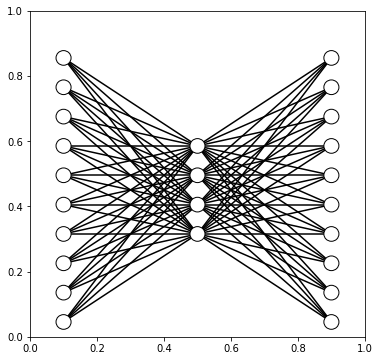

In [8]:
mlp_fig = plt.figure(figsize=(6, 6))
draw_neural_net(mlp_fig.gca(), .1, .9, .0005, .9, [10, 4, 10])

## Implementation of the MLP
Firstly, define the necessary functions.

In [9]:
# functions
def sigmoid(x):
    """The sigmoid function.
    Input: A vector in any dimension
    Output: Applying Sigmoid function elementwise"""
    return 1.0/(1.0+np.exp(-x))

def sigmoid_delta(x):
    """Derivative of the sigmoid function.
    Input: A vector in any dimension
    Output: Calculate derivative of Sigmoid function elementwise"""
    return sigmoid(x)*(1-sigmoid(x))



The derivative of the Sigmoid function is calculated using the following formula:
$$ \sigma'(x) = \sigma(x) \cdot (1 - \sigma(x)) $$

Now, we proceed with the creation of the artificial neural network. The list ``lengths`` is the number of neurons in each layer of the network. Some clarification might be needed, if: $$layers = [2, 4, 3, 1]$$ This will present us with a four-layer network.
- With the input layer having 2 neurons.
- The first hidden layer having 4 neurons.
- The second hidden layer having 3 neurons. 
- The output layer having 1 neuron.

Using a Gaussian distribution with mean 0 and variance 1, we randomly initialize the biases and weights for out neural network. 
Note: we will not be using biases for the input layer.

In [10]:
class Neural_Network(object):

    def __init__(self, lengths):
        self.num_layers = len(lengths)
        self.lengths = lengths
        self.biases = [np.random.randn(y, 1) for y in lengths[1:]]
        self.weights = [np.random.randn(y, x)
                        for x, y in zip(lengths[:-1], lengths[1:])] 

## Forward propagation
The forward propagation works in a way where the output from one layer is fed as the input to the next layer. This of course means the MPL has no loops as information always moves forward in the network. 

In [11]:
    def forward_propagation(self, x):
        """Here, we define a function to take input x and return the output of our network."""
        for b, w in zip(self.biases, self.weights):
            x = sigmoid(np.dot(w, x)+b)
        return x
    Neural_Network.forward_propagation = forward_propagation
    

## Train using gradient descent
More specifically, mini-batch stochastic gradient descent is used here. The ``training_data`` gives a list of desired inputs and intended outputs. It does this by using tuples in the (x, y) format.

We define the training input as $x \in \mathbb{R}^{15 \times 16}$ and output (a function y(x)) as $y \in \mathbb{R}^{10}$
i.e if 3 is the input, our desired output is:
 \begin{align*}
 y = \begin{bmatrix}
 0 \\
  0 \\
   0 \\
    1 \\
     0 \\
      0 \\
       0 \\
        0 \\
         0 \\
    0
 \end{bmatrix}
 \end{align*}
 
Additionally, we use an algorithm that allows us to find weights and biases such that the networks's output approximates y(x) for all training inputs x. We do this by defining the mean squared error:

$$MSE(w,b) = \frac{1}{2n} \sum_{x} \|y(x) - s|^2 + | W_1 |^2 $$

Where the total number of training inputs is $n$, $s$ is the vector of outputs when $x$ is input. $w$ and $b$ are a collection of all weights and biases respectivly. It is clear that $MSE(w,b) \geq 0$ as non-negative values are being summed. When $MSE(w,b) = 0$, $y(x)$ is precisely $s$, thus our goal is to minimize $MSE(w,b)$. We do this by finding the derivative of $MSE(w,b)$. As the gradient of a function gives the direction of steepest ascent, the neagtive of that gradient gives the step that decreases the function most quickly.


In [12]:
    def grad_descent(self, training_data, step, batch_size, learning_rate, test_data=None):
        if test_data: n_test = len(test_data)
        n = len(training_data)
        for j in xrange(step):
            random.shuffle(training_data)
            batches = [
                training_data[k:k+batch_size]
                for k in xrange(0, n, batch_size)]
            for batch in batches:
                self.update_batch(batch, learning_rate)
            if test_data:
                print "Step {0}: {1} / {2}".format(j, self.evaluate(test_data), n_test)
            else:
                print "Step {0} complete".format(j)
    Neural_Network.grad_descent = grad_descent

This code block samples randomly from the training data. It works by by randomly shuffling the training data in each step. It then partitions this data into batches of the appropriate size. After this, for each batch we apply the gradient descent.

## Calculate the gradient with respect weights using Backpropagation
Using backpropagation, we update out MLP's weights and biases by applying gradient descent to a ``batch``. Below, ``a_b`` and ``a_w`` can be described as lists of numpy arrays layer-by-layer . 

The backpropagation algorithm, is a quick method to compute the gradient of our MSE. So ``update_batch`` simply works by calculaating these gradients for all the training examples in ``batch``. After this, it then updates ``self.weights`` and ``self.biases``.


  

In [13]:
    def update_batch(self, batch, learning_rate):
        a_w = [np.zeros(w.shape) for w in self.weights]
        a_b = [np.zeros(b.shape) for b in self.biases]
        for x, y in batch:
            delta_a_b, delta_a_w = self.back_propagation(x, y)
            a_b = [ab+dab for ab, dab in zip(a_b, delta_a_b)]
            a_w = [aw+daw for aw, daw in zip(a_w, delta_a_w)]
        self.weights = [w-(learning_rate/len(batch))*aw
                        for w, aw in zip(self.weights, a_w)]
        self.biases = [b-(learning_rate/len(batch))*ab
                       for b, ab in zip(self.biases, a_b)]
        
    Neural_Network.update_batch = update_batch

In [14]:
    def back_propagation(self, x, y):
        a_w = [np.zeros(w.shape) for w in self.weights]
        a_b = [np.zeros(b.shape) for b in self.biases]
        # first, forward propagate
        activation = x 
        activations = [x] 
        zs = [] 
        for b, w in zip(self.biases, self.weights):
            z = np.dot(w, activation)+b
            zs.append(z)
            activation = sigmoid(z)
            activations.append(activation)
        # backward 
        delta = self.delta_MSE(activations[-1], y) * \
            sigmoid_delta(zs[-1])
        a_b[-1] = delta
        a_w[-1] = np.dot(delta, activations[-2].transpose())
        for l in xrange(2, self.num_layers):
            z = zs[-l]
            sd = sigmoid_delta(z)
            delta = np.dot(self.weights[-l+1].transpose(), delta) * sd
            a_b[-l] = delta
            a_w[-l] = np.dot(delta, activations[-l-1].transpose())
        return (a_b, a_w)
    
    Neural_Network.back_propagation = back_propagation

Calrifications in the above code:
        - [x] create a list to store activations layer by layer
        - zs stores all z vectors layer by layer
        - For l used in the for loop at the end of this block of code, when l is 1 we talk of the last layer of
        neurons, when l is 2 we talk of the second-last layer, it goes on like this.
        - The tuple returned here representes the gradient of $MSE(w,b)$.  

## Evaluation   
Here, we return the number of test inputs with successful results (Correct outputs). Note that the neural network's output is assumed to be the index of whichever neuron in the final layer has the highest activation.

In [15]:
    def evaluate(self, test_data):
        test_results = [(np.argmax(self.forward_propagation(x)), y)
                        for (x, y) in test_data]
        return sum(int(x == y) for (x, y) in test_results)
    
    Neural_Network.evaluate = evaluate

 ## MSE Derivatives
 Return the vector of partial derivatives of the MSE.

In [16]:
    def delta_MSE(self, output_activations, y):
        return (output_activations-y)
    
    Neural_Network.delta_MSE = delta_MSE

In [17]:
n_net = Neural_Network([240, 30, 10])
n_net.grad_descent(training_data, 30, 10, 3.0, test_data=test_data)

TypeError: unsupported operand type(s) for *: 'float' and 'NoneType'